In [1]:
#Importing the basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
pd.set_option("display.max_rows",None)
pd.set_option("display.max_columns",None)

In [3]:
df=pd.read_csv("Payment_Data_new_project.csv")
df.head()

,accountAgeDays,numItems,localTime,paymentMethod,paymentMethodAgeDays,Category,isWeekend,label
0,29,1,4.745402,paypal,28.204861,shopping,0.0,0
1,725,1,4.742303,storecredit,0.000000,electronics,0.0,0
2,845,1,4.921318,creditcard,0.000000,food,1.0,0
3,503,1,4.886641,creditcard,0.000000,electronics,1.0,0
4,2000,1,5.040929,creditcard,0.000000,shopping,0.0,0


In [4]:
df.shape

(39221, 8)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39221 entries, 0 to 39220
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   accountAgeDays        39221 non-null  int64  
 1   numItems              39221 non-null  int64  
 2   localTime             39221 non-null  float64
 3   paymentMethod         39221 non-null  object 
 4   paymentMethodAgeDays  39221 non-null  float64
 5   Category              39126 non-null  object 
 6   isWeekend             38661 non-null  float64
 7   label                 39221 non-null  int64  
dtypes: float64(3), int64(3), object(2)
memory usage: 2.4+ MB


In [6]:
df.isna().sum() #total null values per feature

accountAgeDays            0
numItems                  0
localTime                 0
paymentMethod             0
paymentMethodAgeDays      0
Category                 95
isWeekend               560
label                     0
dtype: int64

# Univariate analysis

Analysis of Label feature

In [7]:
df["label"].value_counts() # Imbalance class

0    38661
1      560
Name: label, dtype: int64

potentially fraudulent - 560 and legitimate - 38661


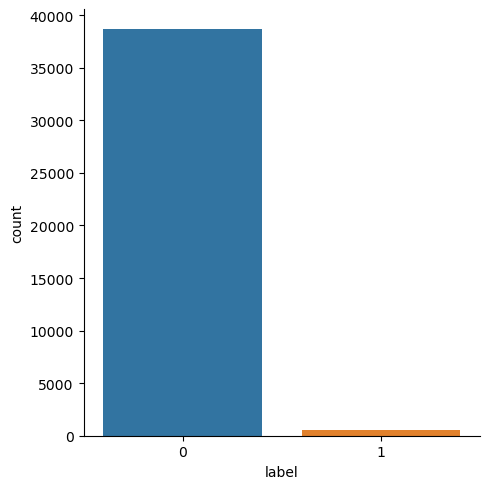

In [8]:
#visualization of the total count of each target class

pos = df[df['label'] == 1].shape[0]
neg = df[df['label'] == 0].shape[0]
print(f"potentially fraudulent - {pos} and legitimate - {neg}")
sns.catplot(data=df, x='label', kind="count")
plt.show()


Analysis of LocalTime

In [9]:
#Unique values in the local time
df.head()
df["localTime"].value_counts()

4.921318    2444
4.921349    2353
4.876771    2333
4.886641    2313
5.034622    2310
4.524580    2302
4.748314    2284
5.017904    2276
4.745402    2264
4.836982    2253
4.962055    2244
4.965339    2155
4.895263    2081
5.040929    2050
4.742303    1696
4.505662    1531
4.057414    1088
4.461622    1083
3.954522     646
3.575983     443
3.483951     365
3.066058     264
2.948940     228
2.596228     213
0.421214       2
Name: localTime, dtype: int64

In [10]:
import warnings
warnings.filterwarnings("ignore")

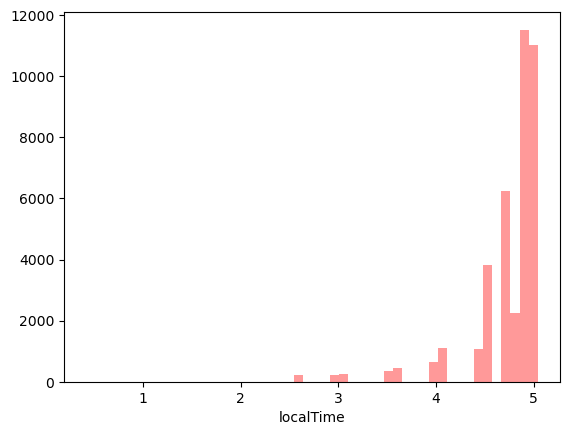

In [11]:
#Visualization of distribution of LocalTime
sns.distplot(df["localTime"],kde=False,color='red')
plt.show()

Analysis of accountAgeDays

In [12]:
df["accountAgeDays"].value_counts()[:10]

2000    8212
2       1243
3        723
1        560
4        477
5        388
6        315
7        298
9        206
8        205
Name: accountAgeDays, dtype: int64

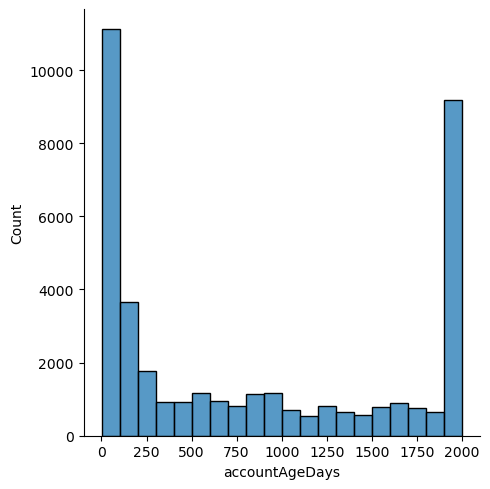

In [13]:
sns.displot(df["accountAgeDays"])
plt.show()

# Multivariate analysis

Analysis of isWeekend bifurcated with Category

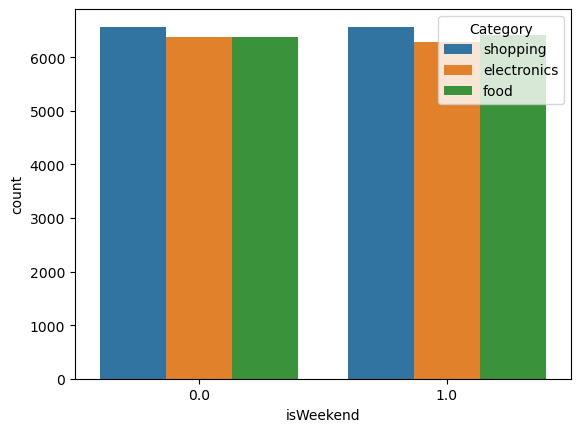

In [14]:
sns.countplot(x="isWeekend",data=df,hue="Category")
plt.show()

In [15]:
df.head()

,accountAgeDays,numItems,localTime,paymentMethod,paymentMethodAgeDays,Category,isWeekend,label
0,29,1,4.745402,paypal,28.204861,shopping,0.0,0
1,725,1,4.742303,storecredit,0.000000,electronics,0.0,0
2,845,1,4.921318,creditcard,0.000000,food,1.0,0
3,503,1,4.886641,creditcard,0.000000,electronics,1.0,0
4,2000,1,5.040929,creditcard,0.000000,shopping,0.0,0


In [16]:
Category_count=df.groupby('Category').aggregate(Category=('numItems',np.size))

In [17]:
Category_count

,Category
Category,
electronics,12834
food,12964
shopping,13328


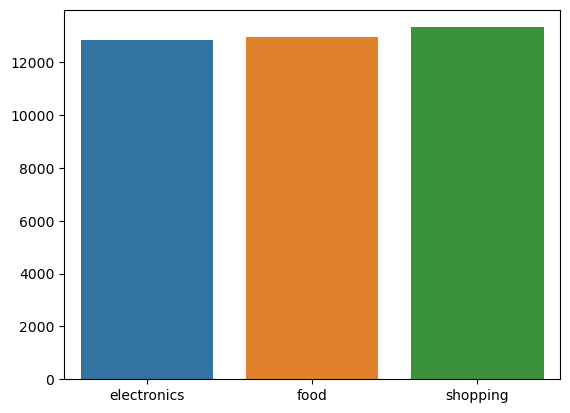

In [18]:
sns.barplot(x=Category_count.index.values,y=Category_count.Category.values)
plt.show()

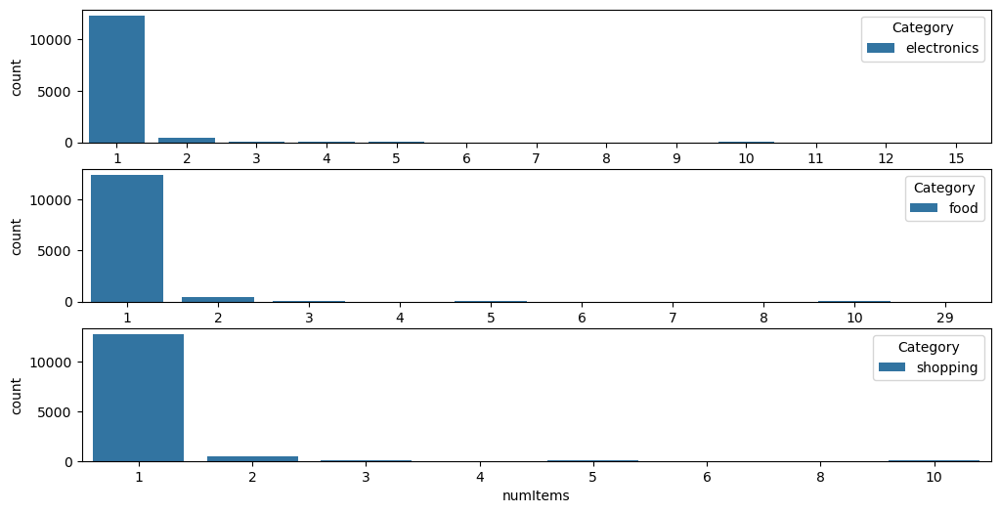

In [19]:
fig,ax=plt.subplots(figsize=(12,6))

plt.subplot(3,1,1)
new_df1=df[df['Category']=="electronics"]
sns.countplot(x='numItems',data=new_df1,hue='Category')
ax.set_xlabel("Number of electronics items")
ax.set_ylabel("Frequency")
plt.show

plt.subplot(3,1,2)
new_df2=df[df['Category']=="food"]
sns.countplot(x='numItems',data=new_df2,hue='Category')
ax.set_xlabel("Number of food items")
ax.set_ylabel("Frequency")
plt.show


plt.subplot(3,1,3)
new_df3=df[df['Category']=="shopping"]
sns.countplot(x='numItems',data=new_df3,hue='Category')
ax.set_xlabel("Number of shopping items")
ax.set_ylabel("Frequency")
plt.show()

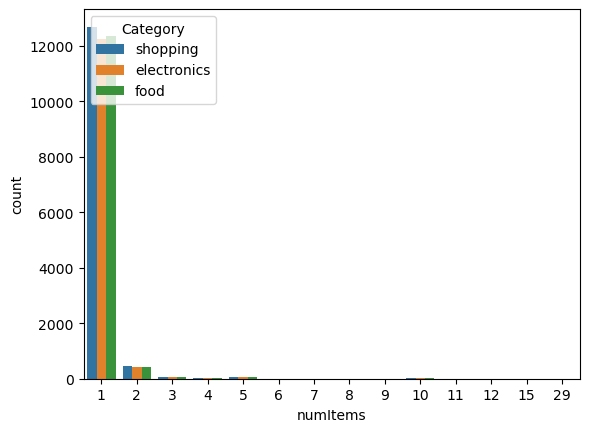

In [20]:
sns.countplot(x="numItems",data=df,hue="Category")
plt.show()

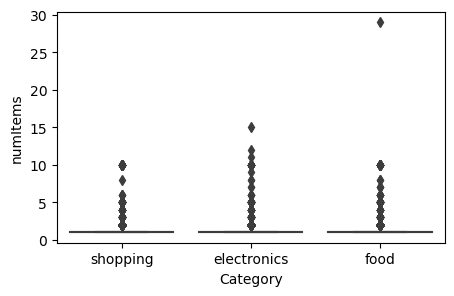

In [21]:
plt.subplots(figsize=(5,3))
sns.boxplot(x="Category",y="numItems",data=df)
plt.show()

In [22]:
df["numItems"].value_counts()

1     37398
2      1348
5       168
3       164
10       71
4        42
6        15
8         5
7         5
12        1
15        1
29        1
9         1
11        1
Name: numItems, dtype: int64

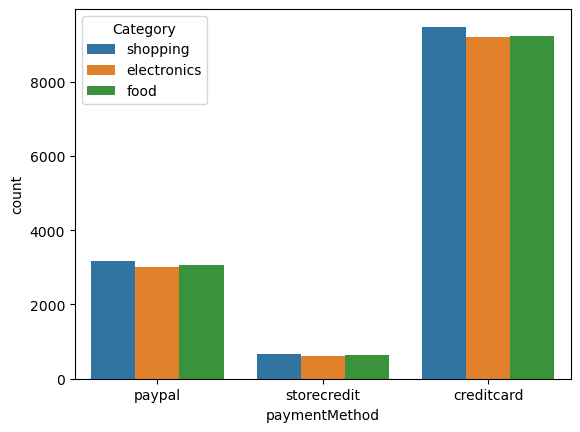

In [23]:
sns.countplot(x="paymentMethod",data=df
            ,hue="Category")
plt.show()

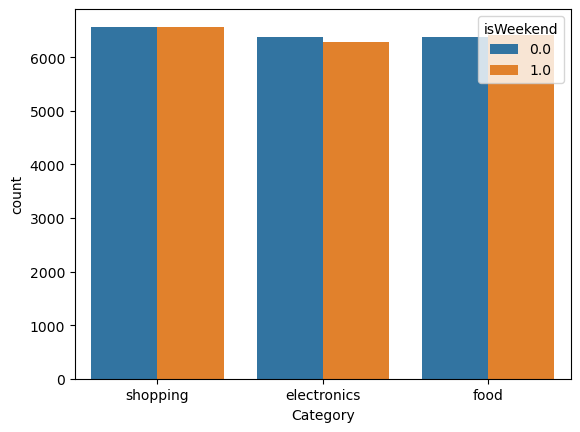

In [24]:
sns.countplot(x="Category",data=df
            ,hue="isWeekend")
plt.show()

In [25]:
df.head()

,accountAgeDays,numItems,localTime,paymentMethod,paymentMethodAgeDays,Category,isWeekend,label
0,29,1,4.745402,paypal,28.204861,shopping,0.0,0
1,725,1,4.742303,storecredit,0.000000,electronics,0.0,0
2,845,1,4.921318,creditcard,0.000000,food,1.0,0
3,503,1,4.886641,creditcard,0.000000,electronics,1.0,0
4,2000,1,5.040929,creditcard,0.000000,shopping,0.0,0


#  Check for multicollinearity

check for correlation and plotting the same

In [26]:
X_multi=df.drop(columns='label',axis=1)
X_multi

,accountAgeDays,numItems,localTime,paymentMethod,paymentMethodAgeDays,Category,isWeekend
0,29,1,4.745402,paypal,28.204861,shopping,0.0
1,725,1,4.742303,storecredit,0.000000,electronics,0.0
2,845,1,4.921318,creditcard,0.000000,food,1.0
3,503,1,4.886641,creditcard,0.000000,electronics,1.0
4,2000,1,5.040929,creditcard,0.000000,shopping,0.0
5,119,1,4.962055,paypal,0.000000,shopping,0.0
6,2000,1,4.921349,paypal,0.000000,electronics,1.0
7,371,1,4.876771,creditcard,0.000000,electronics,0.0
8,2000,1,4.748314,creditcard,0.000000,electronics,0.0
9,4,1,4.461622,creditcard,0.000000,shopping,1.0


In [27]:
X_multi["paymentMethod"]=X_multi["paymentMethod"].replace({"paypal":1,"storecredit":2,"creditcard":3})
X_multi["Category"]=X_multi["Category"].replace({"shopping":1,"food":2,"electronics":3})

In [29]:
X_multi=X_multi[~X_multi["isWeekend"].isna()]
X_multi=X_multi[~X_multi["Category"].isna()]

In [31]:
X_multi.isna().sum()

accountAgeDays          0
numItems                0
localTime               0
paymentMethod           0
paymentMethodAgeDays    0
Category                0
isWeekend               0
dtype: int64

<AxesSubplot:>

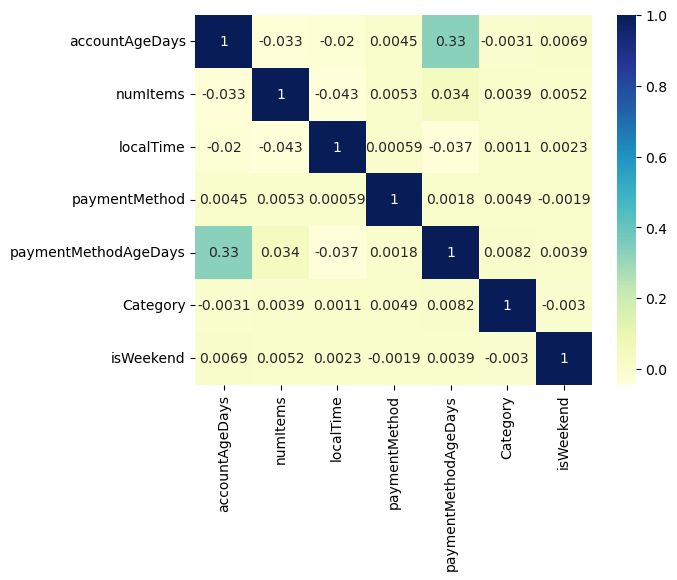

In [44]:
sns.heatmap(X_multi.corr(),cmap='YlGnBu',annot=True)


# Check for the outliers


In [45]:
def outlier(data):
    list_outlier=[]
    q1=np.percentile(data,25,interpolation='midpoint') # created a function to segeregate the outliers.
    q3=np.percentile(data,75,interpolation='midpoint')
    IQR=q3-q1
    ll=q1-1.5*IQR
    ul=q3+1.5*IQR
    for x in data:
        if(x>ul) or (x<ll):
            list_outlier.append(x)
    return list_outlier
            

In [46]:
df.describe()

,accountAgeDays,numItems,localTime,paymentMethodAgeDays,isWeekend,label
count,39221.000000,39221.000000,39221.000000,39221.000000,38661.000000,39221.000000
mean,857.563984,1.084751,4.748232,122.641326,0.499547,0.014278
std,804.788212,0.566899,0.389360,283.569177,0.500006,0.118636
min,1.000000,1.000000,0.421214,0.000000,0.000000,0.000000
25%,72.000000,1.000000,4.742303,0.000000,0.000000,0.000000
50%,603.000000,1.000000,4.886641,0.012500,0.000000,0.000000
75%,1804.000000,1.000000,4.962055,87.510417,1.000000,0.000000
max,2000.000000,29.000000,5.040929,1999.580556,1.000000,1.000000


In [47]:
for i in df.columns:
    if df[i].dtype != object:
        print(f"The outliers in {i} is {set(outlier(df[i])[0:20])}")
        print("***"*40)

The outliers in accountAgeDays is set()
************************************************************************************************************************
The outliers in numItems is {2, 3, 4, 5}
************************************************************************************************************************
The outliers in localTime is {2.596228, 3.066058, 3.483951, 4.057414, 2.94894, 3.575983, 3.954522}
************************************************************************************************************************
The outliers in paymentMethodAgeDays is {641.3215278, 1034.671528, 405.1361111, 544.96875, 948.8069444, 316.0368056, 708.9708333, 978.7527778, 981.3465278, 597.16875, 342.8895833, 348.3055556, 221.2590278, 225.3180556, 367.8138889, 244.5597222, 1142.90625, 503.425, 248.7743056, 635.6416667}
************************************************************************************************************************
The outliers in isWeekend is set()
*********

In [ ]:
! pip install xgboost


In [48]:
df.head(1)

,accountAgeDays,numItems,localTime,paymentMethod,paymentMethodAgeDays,Category,isWeekend,label
0,29,1,4.745402,paypal,28.204861,shopping,0.0,0


In [43]:

from statistics import mean
import matplotlib.pyplot as plt
import warnings
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import accuracy_score, classification_report,ConfusionMatrixDisplay, \
                            precision_score, recall_score, f1_score, roc_auc_score,roc_curve,confusion_matrix,plot_confusion_matrix


from sklearn import metrics
from sklearn.model_selection import  train_test_split,cross_val_score


from sklearn.impute import SimpleImputer, KNNImputer
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler,RobustScaler


warnings.filterwarnings("ignore")
%matplotlib inline

In [ ]:
df.head()

In [49]:
df["Category"].value_counts()

shopping       13328
food           12964
electronics    12834
Name: Category, dtype: int64

In [50]:
y = df['label']
x = df.drop('label', axis=1)

In [51]:
x["paymentMethod"]=x["paymentMethod"].replace({"paypal":1,"storecredit":2,"creditcard":3})
x["Category"]=x["Category"].replace({"shopping":1,"food":2,"electronics":3})

In [52]:
robust_scaler = RobustScaler()
x_transformed = robust_scaler.fit_transform(x)

# Filling of Nan Vlaues

In [53]:
result = []
strategies = [str(i) for i in range(1,4)]
for s in strategies:
    pipeline = Pipeline(steps = [('i', KNNImputer(n_neighbors=int(s))), ('m', LogisticRegression())])
    scores = cross_val_score(pipeline, x_transformed, y, scoring='accuracy', cv=2, n_jobs=3)
    result.append(scores)
    print(f"n_neighbours {s} || accuracy {mean(scores)}")

n_neighbours 1 || accuracy 0.9855689540970135
n_neighbours 2 || accuracy 0.9855689540970135
n_neighbours 3 || accuracy 0.9855689540970135


In [54]:
result = []
strategies = [str(i) for i in range(1,4)]
for s in strategies:
    pipeline = Pipeline(steps = [('i', KNNImputer(n_neighbors=int(s))), ('m', DecisionTreeClassifier())])
    scores = cross_val_score(pipeline, x_transformed, y, scoring='accuracy', cv=2, n_jobs=3)
    result.append(scores)
    print(f"n_neighbours {s} || accuracy {mean(scores)}")

n_neighbours 1 || accuracy 1.0
n_neighbours 2 || accuracy 1.0
n_neighbours 3 || accuracy 1.0


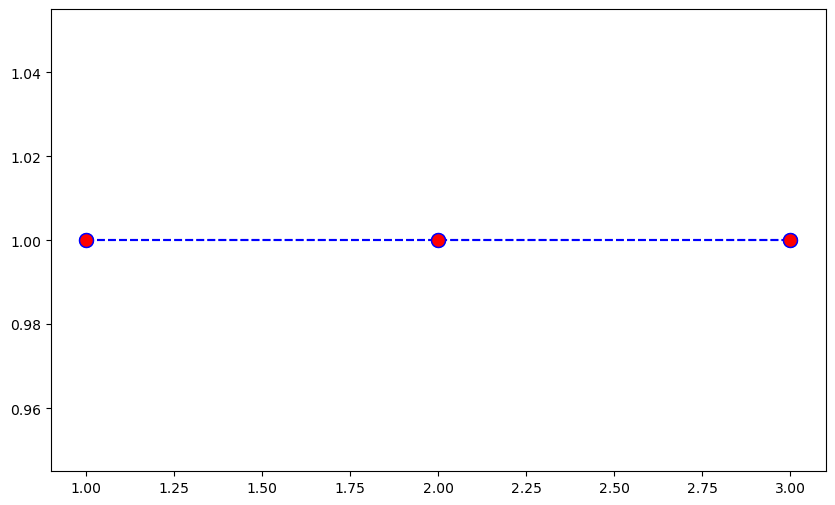

In [55]:
plt.figure(figsize=(10,6))
plt.plot(range(1,4),result,color='blue', linestyle='dashed', marker= 'o',
markerfacecolor='red', markersize=10)

In [56]:
knn_pipline = Pipeline(steps=[
    ('imputer' , KNNImputer(n_neighbors=3)),
    ('scaler', RobustScaler())
])

x_knn = knn_pipline.fit_transform(x)

In [57]:
from imblearn.combine import SMOTETomek

smt = SMOTETomek(random_state = 101, sampling_strategy = 'minority', n_jobs = 3)
x_res, y_res = smt.fit_resample(x_knn, y)

In [58]:
y_res.value_counts()

0    38657
1    38657
Name: label, dtype: int64

# Model Building

In [60]:
models = {
    'Logistic Regression' : LogisticRegression(),
    'Random Forest' : RandomForestClassifier(),
    'Decision Tree' : DecisionTreeClassifier(),
    'Gradient boosting' : GradientBoostingClassifier(),
    'xgbclassifier' : XGBClassifier(),
}

In [64]:

def evaluate_clf(true, predicted):

    acc = accuracy_score(true, predicted)
    f1 = f1_score(true, predicted)
    precision = precision_score(true, predicted)
    recall = recall_score(true, predicted)
    roc_auc = roc_auc_score(true, predicted)

    return acc, f1, precision, recall, roc_auc


def evalute_model(X, y, models):

    # split of the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=101)

    model_list = []
    accuracy_list =[]
    recall_list=[]

    for i in range(len(list(models))):
        model = list(models.values())[i]
        # train the model
        model.fit(X_train, y_train)

        # make predictions
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

        # training set performance
        model_train_acc, model_train_f1, model_train_pre, model_train_recall, model_train_auc = evaluate_clf(y_train, y_train_pred)

       

        # test set performance
        model_test_acc, model_test_f1, model_test_pre, model_test_recall, model_test_auc = evaluate_clf(y_test, y_test_pred)

        
        
        #Confusion Matrix
        
        print(list(models.keys())[i].upper())
        model_list.append(list(models.keys())[i])

        print("model Perfomance for Training data")
        print(f"Accuracy: {model_train_acc}")
        print(f"f1 score: {model_train_f1}")
        print(f"precision score: {model_train_pre}")
        print(f"recall score: {model_train_recall}")
        print(f"total cost: {train_cost}")

        print('-'*60)

        print("model Perfomance for test data")
        print(f"Accuracy: {model_test_acc}")
        print(f"f1 score: {model_test_f1}")
        print(f"precision score: {model_test_pre}")
        print(f"recall score: {model_test_recall}")
        print(f"total cost: {test_cost}")
        accuracy_list.append(model_test_acc)
        recall_list.append(model_test_recall)
        
        print('='*60)
        print(classification_report(y_test,y_test_pred))
        conf_matrix=plot_confusion_matrix(model,X_test,y_test)
        conf_matrix
        plt.show()

    report = pd.DataFrame(list(zip(model_list ,accuracy_list,recall_list)), columns=["model","Accuracy","Recall"])
    return report

LOGISTIC REGRESSION
model Perfomance for Training data
Accuracy: 0.9220707830107839
f1 score: 0.9275536583899477
precision score: 0.8648951676196883
recall score: 1.0
total cost: 48200
------------------------------------------------------------
model Perfomance for test data
Accuracy: 0.9231714415055293
f1 score: 0.9292435973793924
precision score: 0.8678384692401825
recall score: 1.0
total cost: 11880
              precision    recall  f1-score   support

           0       1.00      0.84      0.92      7662
           1       0.87      1.00      0.93      7801

    accuracy                           0.92     15463
   macro avg       0.93      0.92      0.92     15463
weighted avg       0.93      0.92      0.92     15463



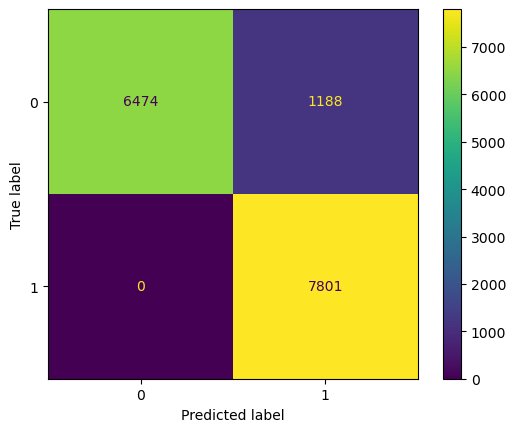

RANDOM FOREST
model Perfomance for Training data
Accuracy: 1.0
f1 score: 1.0
precision score: 1.0
recall score: 1.0
total cost: 0
------------------------------------------------------------
model Perfomance for test data
Accuracy: 1.0
f1 score: 1.0
precision score: 1.0
recall score: 1.0
total cost: 0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7662
           1       1.00      1.00      1.00      7801

    accuracy                           1.00     15463
   macro avg       1.00      1.00      1.00     15463
weighted avg       1.00      1.00      1.00     15463



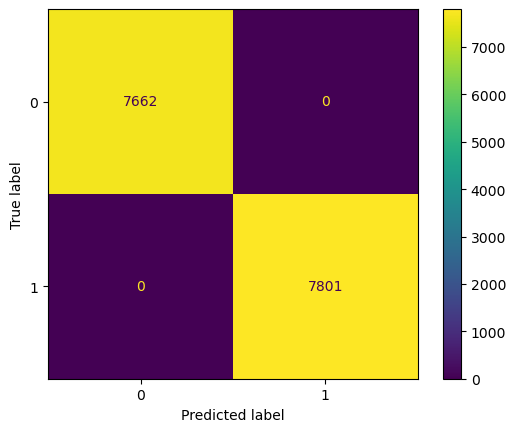

DECISION TREE
model Perfomance for Training data
Accuracy: 1.0
f1 score: 1.0
precision score: 1.0
recall score: 1.0
total cost: 0
------------------------------------------------------------
model Perfomance for test data
Accuracy: 1.0
f1 score: 1.0
precision score: 1.0
recall score: 1.0
total cost: 0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7662
           1       1.00      1.00      1.00      7801

    accuracy                           1.00     15463
   macro avg       1.00      1.00      1.00     15463
weighted avg       1.00      1.00      1.00     15463



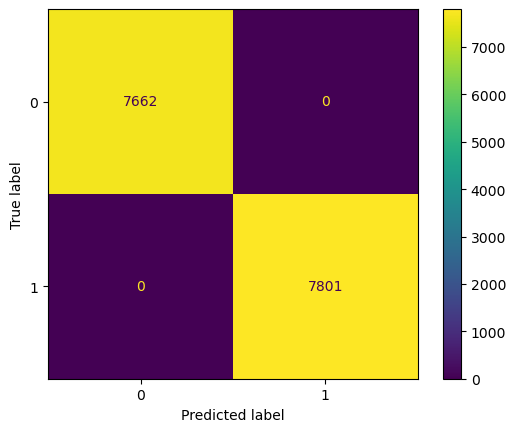

GRADIENT BOOSTING
model Perfomance for Training data
Accuracy: 1.0
f1 score: 1.0
precision score: 1.0
recall score: 1.0
total cost: 0
------------------------------------------------------------
model Perfomance for test data
Accuracy: 1.0
f1 score: 1.0
precision score: 1.0
recall score: 1.0
total cost: 0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7662
           1       1.00      1.00      1.00      7801

    accuracy                           1.00     15463
   macro avg       1.00      1.00      1.00     15463
weighted avg       1.00      1.00      1.00     15463



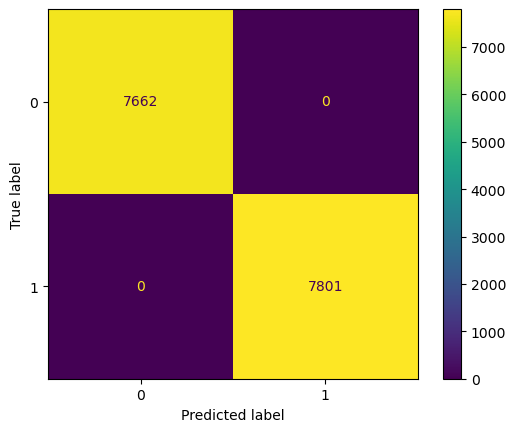

XGBCLASSIFIER
model Perfomance for Training data
Accuracy: 1.0
f1 score: 1.0
precision score: 1.0
recall score: 1.0
total cost: 0
------------------------------------------------------------
model Perfomance for test data
Accuracy: 1.0
f1 score: 1.0
precision score: 1.0
recall score: 1.0
total cost: 0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7662
           1       1.00      1.00      1.00      7801

    accuracy                           1.00     15463
   macro avg       1.00      1.00      1.00     15463
weighted avg       1.00      1.00      1.00     15463



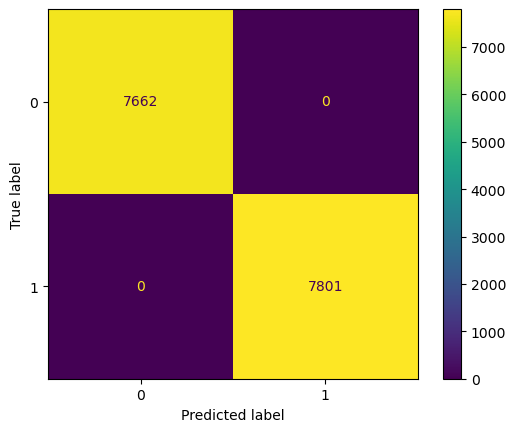

In [65]:
report = evalute_model(x_res, y_res, models)

In [68]:
X_train, X_test, y_train, y_test = train_test_split(x_res, y_res, test_size= 0.2, random_state=101)
xgbclassifier = XGBClassifier()
xgbclassifier.fit(X_train, y_train)
y_train_pred = xgbclassifier.predict(X_train)
y_test_pred = xgbclassifier.predict(X_test)

In [71]:
df

,TPR,FPR,Threshold
0,0.0,0.0,2
1,1.0,0.0,1
2,1.0,1.0,0


In [66]:
report

,model,Accuracy,Recall
0,Logistic Regression,0.923171,1.0
1,Random Forest,1.000000,1.0
2,Decision Tree,1.000000,1.0
3,Gradient boosting,1.000000,1.0
4,xgbclassifier,1.000000,1.0
